# Part 1 - Exploring the Data and Making it Usable

Importing all necessary libraries

In [ ]:
import matplotlib
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models, torchvision.datasets
from torch.utils.data import Dataset, DataLoader, Subset
import pandas as pd
from collections import Counter
from torch.utils.data.sampler import SubsetRandomSampler
from PIL import Image, ImageEnhance
import torchvision.transforms as transforms
from torchvision.transforms import ToPILImage
import tensorflow as tf
from keras.utils.image_utils import img_to_array, load_img
import random

from copy import copy
from keras.applications.vgg16 import preprocess_input, VGG16
from collections import OrderedDict
from os import listdir
from keras import models

from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
from itertools import product


%matplotlib inline

Mounting the drive

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

text_filepath = '/content/gdrive/MyDrive/DatasetProjectCSC413/Flickr8k_text/Flickr8k.token.txt'
jpg_filepath = '/content/gdrive/MyDrive/DatasetProjectCSC413/Flicker8k_Dataset'

Mounted at /content/gdrive


Some stats from the datatset

In [ ]:
def get_longest_list(lst):
    return max(lst, key=len)

file_path = '/content/Flickr8k.token.txt'

descriptions = []
for line in open(text_filepath):
    words = line.split()
    description = [word.lower() for word in words][1:] #no need to include image id in description
    descriptions.append(description)

vocab = set([w for s in descriptions for w in s])
print("Number of descriptions:", len(descriptions)) 
print()
print("Vocab size:", len(vocab)) 
print()
print("Sample words from vocab:", list(vocab)[0:10])
print()
print("Sample description:", descriptions[0])
print()
print("Longest description length:", len(get_longest_list(descriptions)))

description_length_sum = 0
for sentence in descriptions:
  description_length_sum += len(sentence)

print("Average description length: ", description_length_sum / len(descriptions))
print()
words_combined = []

for i in range(len(descriptions)):
  words_combined.extend(descriptions[i])

counter = Counter(words_combined)

print("Most common words:")
print(counter.most_common(50))

print()

print("Total number of words:", description_length_sum)
print()
print("How often words appear:")
counter_mc = counter.most_common()
for pair in counter_mc[:50]:
  print(pair[0], str(100 * pair[1]/description_length_sum) + "%")

Number of descriptions: 40460

Vocab size: 8918

Sample words from vocab: ['bushes', 'flaming', 'referring', 'beats', 'beard', 'dressed', 'pacifier', 'trip', 'aig', 'spectating']

Sample description: ['a', 'child', 'in', 'a', 'pink', 'dress', 'is', 'climbing', 'up', 'a', 'set', 'of', 'stairs', 'in', 'an', 'entry', 'way', '.']

Longest description length: 38
Average description length:  11.782155215027187

Most common words:
[('a', 62989), ('.', 36581), ('in', 18975), ('the', 18419), ('on', 10744), ('is', 9345), ('and', 8852), ('dog', 8136), ('with', 7765), ('man', 7266), ('of', 6713), ('two', 5639), ('white', 3940), ('black', 3832), ('boy', 3581), ('are', 3505), ('woman', 3403), ('girl', 3328), (',', 3232), ('to', 3173), ('wearing', 3062), ('at', 2915), ('people', 2887), ('water', 2783), ('red', 2672), ('young', 2630), ('brown', 2563), ('an', 2432), ('his', 2357), ('blue', 2268), ('dogs', 2125), ('running', 2073), ('through', 2032), ('playing', 2008), ('while', 1968), ('down', 1825), (

In [ ]:

dfcount = pd.DataFrame({"word": counter.keys(), "count":counter.values()})
dfcount = dfcount.sort_values("count", ascending=False)
dfcount = dfcount.reset_index()[["word", "count"]]
dfcount.head()


,word,count
0,a,62989
1,.,36581
2,in,18975
3,the,18419
4,on,10744


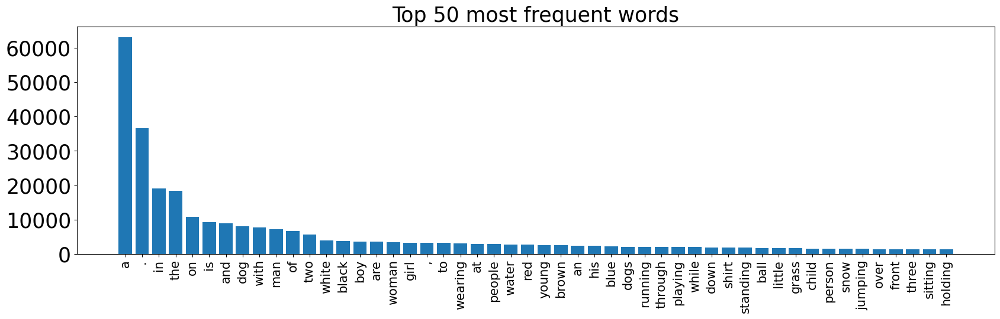

In [ ]:
df_50 = dfcount.iloc[:50,:]

plt.figure(figsize=(20,5))
plt.bar(df_50.index, df_50["count"])
plt.yticks(fontsize=25)
plt.xticks(df_50.index, df_50["word"], rotation = 90, fontsize=15)
plt.title("Top 50 most frequent words", fontsize=25)
plt.show()


Adding words to our vocabulary to denote the start, end, and padding of a description

In [ ]:
def add_start_and_end_tokens(lst):
  captions_list = []
  for caption in lst:
      caption = ['<start>'] + caption + ['<end>']
      captions_list.append(caption)
  return captions_list

token_descs = add_start_and_end_tokens(descriptions)

longest_desc = get_longest_list(token_descs)

# this is the longest sentence. the longest sentence length is 40.
print("Longest description:", longest_desc)
print("Longest description length:", len(longest_desc))


def add_pad(lst):
  new_lst = []
  for i in range(0, len(lst)):
    new_lst.append(lst[i][0:len(lst[i])] + ['<pad>']*(len(longest_desc) - len(lst[i])))
  
  return new_lst


padded_descs = add_pad(token_descs)

print()
print("Sample padded description:", padded_descs[5])
print("number of padded descriptions:", len(padded_descs))


vocab = sorted(list(set([w for s in padded_descs for w in s])))

# A mapping of index => word (string)
vocab_itos = dict(enumerate(vocab))
# A mapping of word => its index
vocab_stoi = {word:index for index, word in vocab_itos.items()}

print()
print("index to word map:", vocab_itos)
print("word to index map:", vocab_stoi)
print("new vocab size:", len(vocab_itos))

Longest description: ['<start>', 'an', 'african-american', 'man', 'wearing', 'a', 'green', 'sweatshirt', 'and', 'blue', 'vest', 'is', 'holding', 'up', '2', 'dollar', 'bills', 'in', 'front', 'of', 'his', 'face', ',', 'while', 'standing', 'on', 'a', 'busy', 'sidewalk', 'in', 'front', 'of', 'a', 'group', 'of', 'men', 'playing', 'instruments', '.', '<end>']
Longest description length: 40

Sample padded description: ['<start>', 'a', 'black', 'dog', 'and', 'a', 'spotted', 'dog', 'are', 'fighting', '<end>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>']
number of padded descriptions: 40460

index to word map: {0: '!', 1: '"', 2: '#', 3: '&', 4: "'", 5: "'n'", 6: "'s", 7: "'s-eye-view", 8: "'slide", 9: '(', 10: ')', 11: ',', 12: '-', 13: '-ependent', 14: '.', 15: '08', 16: '1', 17: '

Converting the words to indices and indices to words

In [ ]:
def words_to_indices(sents):
  final_lst = []
  for s in sents:
      words_to_indices = []
      for w in s:
          words_to_indices.append(vocab_stoi[w])
      final_lst.append(words_to_indices)
  return final_lst

def indices_to_words(indices):
  final_lst = []
  for i in indices:
      indices_to_words = []
      for w in i:
          indices_to_words.append(vocab_itos[w])
      final_lst.append(indices_to_words)
  return final_lst
  
indices = words_to_indices(padded_descs)
print("First 10 descriptions as indices:")
print()
for i in range(0,10):
  index_list = indices[i]
  word_list = indices_to_words([indices[i]])[0]
  print(index_list)
  print(word_list)

  #sanity check
  print("Description length", len(index_list))
  print("Index description length", len(word_list))
  print()

First 10 descriptions as indices:

[70, 72, 1488, 3920, 72, 5654, 2395, 4013, 1593, 8357, 72, 6714, 5140, 7399, 3920, 258, 2618, 8599, 14, 68, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69]
['<start>', 'a', 'child', 'in', 'a', 'pink', 'dress', 'is', 'climbing', 'up', 'a', 'set', 'of', 'stairs', 'in', 'an', 'entry', 'way', '.', '<end>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>']
Description length 40
Index description length 40

[70, 72, 3277, 3337, 3995, 72, 8797, 1114, 14, 68, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69]
['<start>', 'a', 'girl', 'going', 'into', 'a', 'wooden', 'building', '.', '<end>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', 

For each image, we are using only 1 out of the 5 captions as the target caption

In [ ]:
# keep only one out of 5 captions
# creating a new list where each caption staring at index 0 corresponds to first
# image then at index 5 corresponds to second image. At every 5th index caption iteration
# corresponds to a unique image

def keep_one(lst):
  one = []
  i = 0
  n = len(lst)
  count = 0
  for i in range(0, len(lst), 5):
      one.append(lst[i])
  return one

one_of_five_indices = keep_one(indices)
one_of_five_words = indices_to_words(one_of_five_indices)
print("First 10 descriptions after keeping only 1 out of 5 for each image")
print()
for i in range(0,10):
  print(one_of_five_indices[i])
  print(one_of_five_words[i])
  print()

# one_of_five will be used as data.
print("New number of descriptions after keeping only 1 out of 5 for each image:", len(one_of_five_words))

First 10 descriptions after keeping only 1 out of 5 for each image

[70, 72, 1488, 3920, 72, 5654, 2395, 4013, 1593, 8357, 72, 6714, 5140, 7399, 3920, 258, 2618, 8599, 14, 68, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69]
['<start>', 'a', 'child', 'in', 'a', 'pink', 'dress', 'is', 'climbing', 'up', 'a', 'set', 'of', 'stairs', 'in', 'an', 'entry', 'way', '.', '<end>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>']

[70, 72, 803, 2310, 263, 72, 7329, 2310, 344, 2860, 68, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69]
['<start>', 'a', 'black', 'dog', 'and', 'a', 'spotted', 'dog', 'are', 'fighting', '<end>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>',

We now make a dataframe and take a look at some of the images in our data

In [ ]:
# here to orangize the data, we would like to use a dataframe using pandas.
# we want to load the text data then save it to the dataframe

text_file = open(text_filepath, 'r')
read_text = text_file.read()
text_file.close()

sentences = []
for line in read_text.split('\n'):
    column = line.split('\t')
    if len(column) == 1:
        continue
    word = column[0].split('#')
    sentences.append(word + [column[1].lower()])
#dataframe for text data
df_text = pd.DataFrame(sentences, columns=["filename", "index", "caption"])

unique_filenames = np.unique(df_text.filename.values)
df_text = df_text[['index', 'filename', 'caption']]

In [ ]:
# dataframe with every 5th caption. First caption represents a unique image id
# then every 5th caption represents a unique image as well
fifth_df= df_text.iloc[::5, :]

# Delete a single column from the DataFrame
fifth_df = fifth_df.drop(labels="index", axis=1)
fifth_df.head(5)



,filename,caption
0,1000268201_693b08cb0e.jpg,a child in a pink dress is climbing up a set o...
5,1001773457_577c3a7d70.jpg,a black dog and a spotted dog are fighting
10,1002674143_1b742ab4b8.jpg,a little girl covered in paint sits in front o...
15,1003163366_44323f5815.jpg,a man lays on a bench while his dog sits by him .
20,1007129816_e794419615.jpg,a man in an orange hat starring at something .


In [ ]:
print(len(fifth_df))

8092


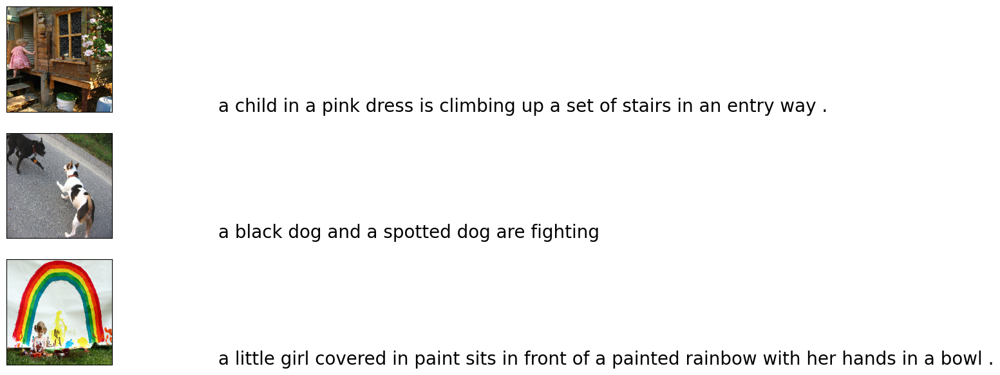

In [ ]:
# lets get the  3 captions for each unique image, we will just show 3 images


count = 1
fig = plt.figure(figsize=(10,20))
for name in unique_filenames[:3]:
  file_name = jpg_filepath + '/' + name
  caption = list(fifth_df["caption"].loc[fifth_df["filename"]==name].values)
  load_image = load_img(file_name, target_size=(230,230))

  img = fig.add_subplot(8,2,count,xticks=[],yticks=[])
  img.imshow(load_image)
  count +=1

  img = fig.add_subplot(8,2,count)
  plt.axis('off')
  img.plot()
  img.set_xlim(0,1)
  img.set_ylim(0, len(caption))

  for i, caption in enumerate(caption):
    img.text(0,i,caption,fontsize=20)
  count +=1
plt.show()

In [ ]:
# this final dataframe will be useful for our model

fifth_df["padded_description"] = one_of_five_words
fifth_df["padded_description_indices"] = one_of_five_indices


fifth_df.head(5)

,filename,caption,padded_description,padded_description_indices
0,1000268201_693b08cb0e.jpg,a child in a pink dress is climbing up a set o...,"[<start>, a, child, in, a, pink, dress, is, cl...","[70, 72, 1488, 3920, 72, 5654, 2395, 4013, 159..."
5,1001773457_577c3a7d70.jpg,a black dog and a spotted dog are fighting,"[<start>, a, black, dog, and, a, spotted, dog,...","[70, 72, 803, 2310, 263, 72, 7329, 2310, 344, ..."
10,1002674143_1b742ab4b8.jpg,a little girl covered in paint sits in front o...,"[<start>, a, little, girl, covered, in, paint,...","[70, 72, 4443, 3277, 1887, 3920, 5339, 6941, 3..."
15,1003163366_44323f5815.jpg,a man lays on a bench while his dog sits by him .,"[<start>, a, man, lays, on, a, bench, while, h...","[70, 72, 4578, 4308, 5170, 72, 728, 8675, 3737..."
20,1007129816_e794419615.jpg,a man in an orange hat starring at something .,"[<start>, a, man, in, an, orange, hat, starrin...","[70, 72, 4578, 3920, 258, 5213, 3608, 7420, 41..."


In [ ]:
# Deleting an invalid row
if '2258277193_586949ec62.jpg.1' in fifth_df.values :
    print("\nThis value exists in Dataframe")
ids = fifth_df.index[fifth_df['filename'] == '2258277193_586949ec62.jpg.1'].tolist()
print(ids)

df_new = fifth_df[fifth_df['filename'] == '2258277193_586949ec62.jpg.1']
print(df_new)
print(len(fifth_df))

fifth_df = fifth_df.drop(labels=6730)
# after deleteing the invalid filename
print(len(fifth_df))



This value exists in Dataframe
[6730]
                         filename                        caption  \
6730  2258277193_586949ec62.jpg.1  people waiting for the subway   

                                     padded_description  \
6730  [<start>, people, waiting, for, the, subway, <...   

                             padded_description_indices  
6730  [70, 5536, 8503, 3070, 7920, 7617, 68, 69, 69,...  
8092
8091


Creating our dataset, where each data point is a pair consisting of a (3, 224, 224) tensor input image and its tensor list of indices (target caption of size 40)

In [ ]:
pairs = []

for i in range(0, len(fifth_df)):
  pairs.append((jpg_filepath + '/' + fifth_df.iat[i,0], fifth_df.iat[i,3]))

print("Pairs sample:", pairs[5])

transform_image = transforms.Compose([transforms.Resize((224, 224)), 
                                      transforms.ToTensor(), 
                                      transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))])

print("Number of data points in dataset:", len(pairs))


Pairs sample: ('/content/gdrive/MyDrive/DatasetProjectCSC413/Flicker8k_Dataset/1007320043_627395c3d8.jpg', [70, 72, 1488, 5722, 5170, 72, 6431, 5024, 14, 68, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69])
Number of data points in dataset: 8091


# Data augmentation
We augment the data like so: take each data point, and create another datapoint with the same image but slightly darker, and use the same caption. This is because we want our model to give the same description about an image even if the objects are slightly harder to see.

new pairs sample ('/content/gdrive/MyDrive/DatasetProjectCSC413/Flicker8k_Dataset/1053804096_ad278b25f1.jpg', [70, 72, 3277, 3920, 5631, 7301, 3920, 7920, 6747, 8561, 14, 68, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69])
Regular image


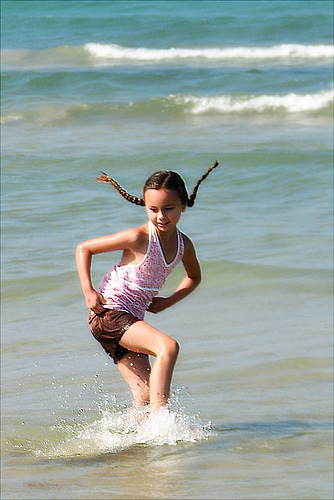

Regular image description [['<start>', 'a', 'girl', 'in', 'pigtails', 'splashes', 'in', 'the', 'shallow', 'water', '.', '<end>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>']]
Dark image


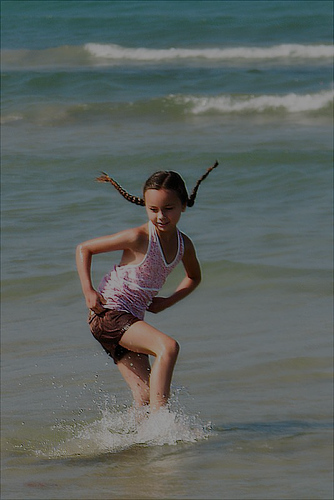

Dark image desciption [['<start>', 'a', 'girl', 'in', 'pigtails', 'splashes', 'in', 'the', 'shallow', 'water', '.', '<end>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>']]
total old number of datapoints: 8091
total new number of datapoints: 16182


In [ ]:
new_pairs = []

for pair in pairs:
  darkened_pair = (pair[0][:pair[0].index(".")] + "darkened.jpg", pair[1])
  new_pairs.append(pair)
  new_pairs.append(darkened_pair)

#new file path, but we use the old file path and add this transformation

#show example of how training dataset should open these images
index_of_sample = 38*2

indices_to_explore = [index_of_sample, index_of_sample+1]

print("new pairs sample", new_pairs[index_of_sample])

for index in indices_to_explore:
  pair = new_pairs[index]
  if "darkened.jpg" in pair[0]:
    img = Image.open(pair[0].replace("darkened.jpg", ".jpg")).convert("RGB")
    enhancer = ImageEnhance.Brightness(img)
    img_dark = enhancer.enhance(0.6)
    print("Dark image")
    img_dark.show()
    print("Dark image desciption", indices_to_words([pair[1]]))
  else:
    img = Image.open(pair[0]).convert("RGB")
    print("Regular image")
    img.show()
    print("Regular image description", indices_to_words([pair[1]]))

print("total old number of datapoints:", len(pairs))
print("total new number of datapoints:", len(new_pairs))


Make our dataset class and split into training set, validation set, and test set 

In [ ]:
mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)

transform_image = transforms.Compose([transforms.Resize((224, 224)), 
                                      transforms.ToTensor(), 
                                      transforms.Normalize(mean=mean, std=std)])

#Note: We normalize the data

class Flicker8k_Dataset(Dataset):
  def __len__(self):
    return len(new_pairs)
  def __getitem__(self, idx):
    pair = new_pairs[idx]

    if "darkened.jpg" in pair[0]:
      img = Image.open(pair[0].replace("darkened.jpg", ".jpg")).convert("RGB")
      enhancer = ImageEnhance.Brightness(img)
      img = enhancer.enhance(0.6)
    else:
      img = Image.open(pair[0]).convert("RGB")
    
    return transform_image(img), torch.tensor(pair[1])

dataset = Flicker8k_Dataset()
print("Dataset size:", len(dataset))

indices = range(len(dataset))

train_indices = indices[:12000]
valid_indices = indices[12000:14000]
test_indices = indices[14000:]

train_data = Subset(dataset, train_indices)
valid_data = Subset(dataset, valid_indices)
test_data = Subset(dataset, test_indices)


for x, y in train_data:
  print(x.shape)
  print(y.shape)
  break

Dataset size: 16182
torch.Size([3, 224, 224])
torch.Size([40])


Sanity check some data points

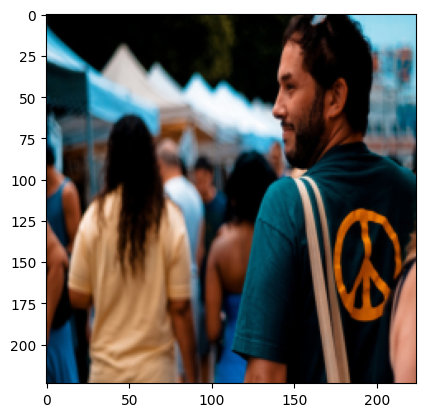

['<start>', 'a', 'dark', 'haired', 'bearded', 'man', 'wearing', 'a', 'turquoise', 'shirt', 'with', 'a', 'yellow', 'peace', 'sign', 'on', 'it', '.', '<end>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>']


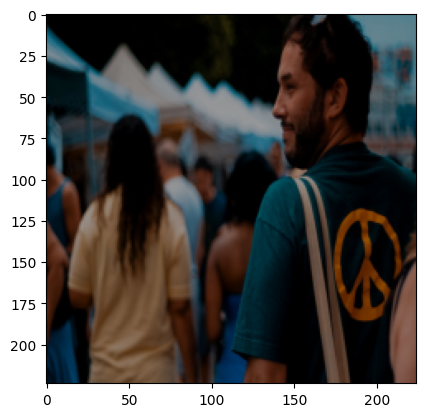

['<start>', 'a', 'dark', 'haired', 'bearded', 'man', 'wearing', 'a', 'turquoise', 'shirt', 'with', 'a', 'yellow', 'peace', 'sign', 'on', 'it', '.', '<end>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>']


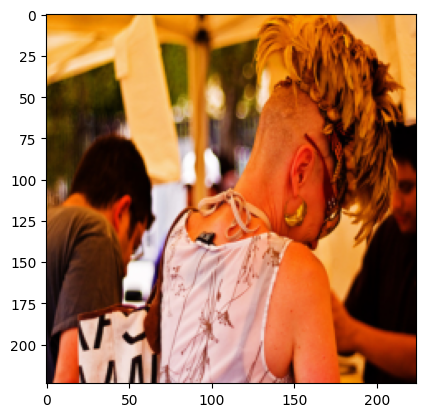

['<start>', 'a', 'man', 'in', 'a', 'feather', 'hat', 'looking', 'down', '.', '<end>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>']


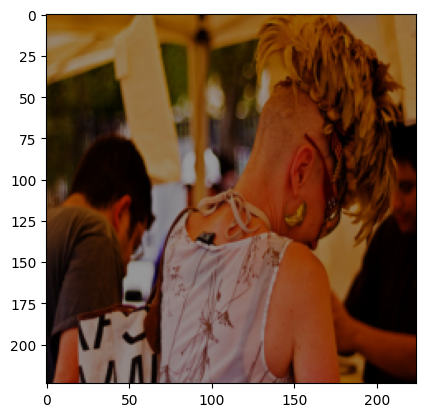

['<start>', 'a', 'man', 'in', 'a', 'feather', 'hat', 'looking', 'down', '.', '<end>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>']


In [ ]:
random_index = 540
small_data = [train_data[random_index], train_data[random_index+1], train_data[random_index+2], train_data[random_index+3]]

unnormalize = transforms.Normalize(
    mean=[-m/s for m, s in zip(mean, std)],
    std=[1/s for s in std]
)

for x, y in small_data:
  xu = unnormalize(x)
  plt.imshow(xu.permute(1, 2, 0))
  plt.show()

  print(indices_to_words([y.tolist()])[0])



# Building the Architecture

Using alexnet

In [ ]:
alexnet = torchvision.models.alexnet(pretrained=True)

/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:01<00:00, 209MB/s]


Making the classes

In [ ]:
class EncoderConvNet(nn.Module): 
  def __init__(self, embed_size): 
    super().__init__()

    self.linear = nn.Linear(256 * 6 * 6, embed_size)
    self.relu = nn.ReLU()


  def forward(self, images): 
    features = alexnet.features(images).detach() 
    features = features.view(-1, 256 * 6 * 6)
    return self.relu(self.linear(features))


class DecoderRecurNet(nn.Module): 
  def __init__(self, embed_size, hidden_size, vocab_size, num_layers): 
    super().__init__()

    self.embed = nn.Embedding(vocab_size, embed_size)
    self.lstm = nn.LSTM(embed_size, hidden_size, num_layers, batch_first=True)
    self.linear = nn.Linear(hidden_size, vocab_size)

  def forward(self, features, captions): 
    embedding = self.embed(captions) 

    
    lstm_input = torch.cat((features.unsqueeze(1), embedding), dim=1)[:, :-1] #input seqience should be image, <start>, word1, ...., word_k
                                                                              #rather than <start>, word1, ...., word_k, <end>
    z = self.lstm(lstm_input)[0]
    y = self.linear(z) 
    return y 
  
class EncoderToDecoder(nn.Module): 
  def __init__(self, embed_size, hidden_size, vocab_size, num_layers): 
    super().__init__()
    self.encoder = EncoderConvNet(embed_size)
    self.decoder = DecoderRecurNet(embed_size, hidden_size, vocab_size, num_layers)

  def forward(self, images, captions): 
    features = self.encoder(images)
    return self.decoder(features, captions)

Make predictions without teacher-forcing

In [ ]:
def make_prediction(model, image, length_limit=40):
  lstm_input = model.encoder(image)
  states = None
  generated_caption = []
  for i in range(length_limit):
    hs, states = model.decoder.lstm(lstm_input, states)
    zs = model.decoder.linear(hs)
    output_word = zs.argmax(1)
    generated_caption.append(output_word.item())
    lstm_input = model.decoder.embed(output_word)

    if vocab_itos[output_word.item()] == "<end>":
      break
  
  return generated_caption

#show an example with untrained weights
embed_size = 250
hidden_size = 300
vocab_size = len(vocab_itos)
num_layers = 1

model = EncoderToDecoder(embed_size, hidden_size, vocab_size, num_layers)
print(indices_to_words([make_prediction(model, train_data[0][0])]))

[['barefoot', 'walled', 'rooftop', 'sloppy', 'adolescent', 'oriental', 'knocking', 'roping', 'artists', 'great', 'pastry', 'protester', 'u', 'homes', 'building', 'desserts', 'missed', 'scarves', 'conoe', 'pre-teen', 'ohio', 'smiff', 'fives', 'accompanies', 'inspects', 'numeral', 'sand', 'secret', 'secret', 'uptop', 'afro', 'watch', 'widows', 'neon-colored', 'attraction', 'foreigners', '25', 'padded', 'meeting', 'pompadour']]


# Training the Model

In [ ]:
pad_index = vocab_stoi["<pad>"]

def get_accuracy(model, data):
    loader = torch.utils.data.DataLoader(data, batch_size=10)

    correct = 0
    total = 0
    bleu_scores = []
    smoothie = SmoothingFunction().method1
    for xs, ts in loader:
        zs = model.forward(xs, ts)

        zs = zs.reshape(-1, zs.shape[2]).detach().numpy()
        ts = ts.reshape(-1).numpy()

        zs = np.argmax(zs, axis=1)

        new_zs = zs[ts != pad_index]
        new_ts = ts[ts != pad_index]

        # Compute how many correct words there are
        correct += np.sum(new_zs == new_ts)
        total += len(new_ts)

        # Compute BLEU score
        pred_caption = indices_to_words([new_zs])
        true_caption = indices_to_words([new_ts])
        bleu_score = sentence_bleu(true_caption, pred_caption[0], smoothing_function=smoothie)
        bleu_scores.append(bleu_score)

    valid_accuracy = correct / total
    avg_bleu_score = sum(bleu_scores) / len(bleu_scores)

    return valid_accuracy, avg_bleu_score

def get_accuracy_no_teacher_forcing(model, data):
    loader = torch.utils.data.DataLoader(data, batch_size=10)

    correct = 0
    total = 0
    bleu_scores = []
    smoothie = SmoothingFunction().method1
    for xs, ts in loader:
        generated_captions = []
        for x in xs:
            generated_caption = make_prediction(model, x.unsqueeze(0))
            generated_captions.append(generated_caption)

        ts = ts.numpy()

        for i, t in enumerate(ts):
            # remove <pad> tokens
            mask = t != pad_index
            new_generated_caption = np.array(generated_captions[i])[mask[:len(generated_captions[i])]]  #same length
            new_t = t[mask]

            # Compute how many correct words there are
            common_elements = np.intersect1d(new_generated_caption, new_t)
            correct += np.size(common_elements)
            total += len(new_t)

            # Compute BLEU score
            pred_caption = indices_to_words([generated_captions[i]])
            true_caption = indices_to_words([new_t])
            bleu_score = sentence_bleu(true_caption, pred_caption[0], smoothing_function=smoothie)
            bleu_scores.append(bleu_score)

    valid_accuracy = correct / total
    avg_bleu_score = sum(bleu_scores) / len(bleu_scores)

    return valid_accuracy, avg_bleu_score




In [ ]:
def train(model, train_data, valid_data, batch_size=10, weight_decay=0.0, learning_rate=0.0003, num_epochs=7):
  criterion = nn.CrossEntropyLoss(ignore_index=vocab_stoi["<pad>"])
  optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

  iters, losses = [], []
  iters_sub, train_accs, train_bleus, val_accs, val_bleus  = [], [], [], [], []
  train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=True)
  loss = 0
  n = 0 # number of iterations

  for epoch in range(num_epochs):

    for xs, ts in train_loader:

        zs = model(xs, ts)

        zs = zs.reshape(-1, zs.shape[2])
        ts = ts.reshape(-1)

        loss = criterion(zs, ts) #reshape so that each time step is its own datapoint with a logit vector, and each target is an index
                                 #corresponding to each datapoint
                          
        loss.backward()       
        optimizer.step()        
        optimizer.zero_grad()    

        iters.append(n)
        losses.append(float(loss.item())) 

        n += 1

    iters_sub.append(n)
    train_cost = float(loss.item())
    train_acc, train_bleu = get_accuracy(model, train_data)
    train_accs.append(train_acc)
    train_bleus.append(train_bleu)
    val_acc, val_bleu = get_accuracy(model, valid_data)

    val_accs.append(val_acc)
    val_bleus.append(val_bleu)
    print("Iter %d. [Val Acc %.0f%%] [Val BLEU Score %.0f%%] [Train Acc %.0f%%, Train BLEU Score %.0f%%,Loss %f]" % (n, val_acc * 100, val_bleu * 100, train_acc * 100, train_bleu * 100, train_cost))

  


  plt.title("Loss Learning Curve")
  plt.plot(iters, losses, label="Train")
  plt.xlabel("Iterations")
  plt.ylabel("Loss")
  plt.show()


  plt.title("Accuracy Learning Curve")
  plt.plot(iters_sub, train_accs, label="Training Accuracy")
  plt.plot(iters_sub, train_bleus, label="Train BLEU Score")
  plt.plot(iters_sub, val_accs, label="Validation Accuracy")
  plt.plot(iters_sub, val_bleus, label="Validation BLEU Score")
  plt.xlabel("Iterations")
  plt.ylabel("Accuracy")
  plt.legend(loc='best')
  plt.show()

  return val_accs, train_accs

Overfitting on a small dataset

Iter 1. [Val Acc 16%] [Val BLEU Score 3%] [Train Acc 19%, Train BLEU Score 6%,Loss 9.085040]
Iter 2. [Val Acc 21%] [Val BLEU Score 4%] [Train Acc 48%, Train BLEU Score 16%,Loss 8.867549]
Iter 3. [Val Acc 21%] [Val BLEU Score 4%] [Train Acc 71%, Train BLEU Score 44%,Loss 8.654799]
Iter 4. [Val Acc 21%] [Val BLEU Score 4%] [Train Acc 78%, Train BLEU Score 51%,Loss 8.447403]
Iter 5. [Val Acc 25%] [Val BLEU Score 9%] [Train Acc 78%, Train BLEU Score 56%,Loss 8.237003]
Iter 6. [Val Acc 30%] [Val BLEU Score 12%] [Train Acc 80%, Train BLEU Score 59%,Loss 8.019371]
Iter 7. [Val Acc 31%] [Val BLEU Score 12%] [Train Acc 78%, Train BLEU Score 57%,Loss 7.790933]
Iter 8. [Val Acc 28%] [Val BLEU Score 12%] [Train Acc 77%, Train BLEU Score 56%,Loss 7.540232]
Iter 9. [Val Acc 30%] [Val BLEU Score 12%] [Train Acc 75%, Train BLEU Score 51%,Loss 7.254914]
Iter 10. [Val Acc 30%] [Val BLEU Score 5%] [Train Acc 61%, Train BLEU Score 32%,Loss 6.927186]
Iter 11. [Val Acc 31%] [Val BLEU Score 5%] [Train Acc 52

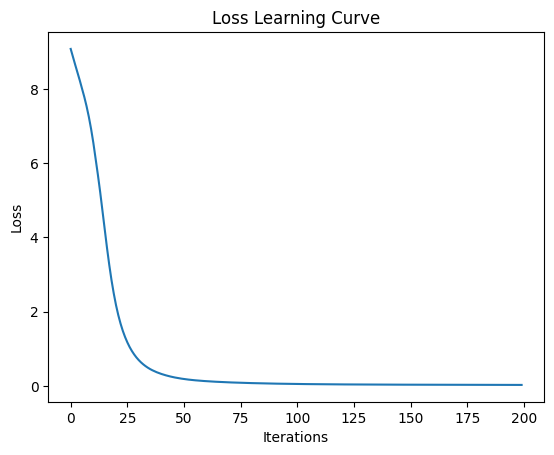

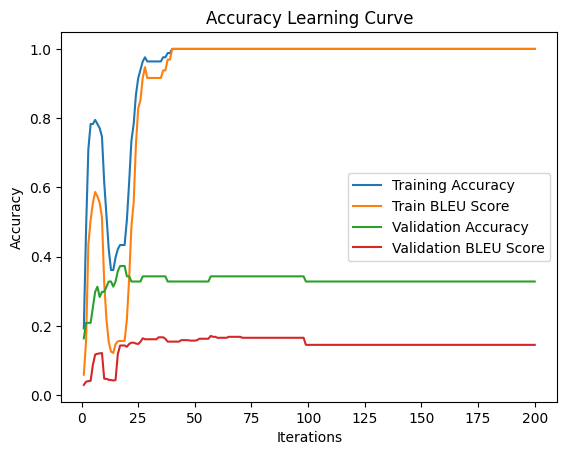

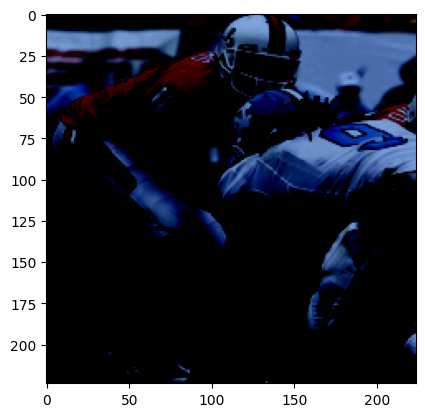

[['<start>', 'one', 'football', 'player', 'wearing', 'an', 'orange', 'jersey', 'and', 'one', 'wearing', 'a', 'white', 'jersey', 'are', 'set', 'at', 'the', 'starting', 'line', '.', '<end>']]
[['<start>', 'one', 'football', 'player', 'wearing', 'an', 'orange', 'jersey', 'and', 'one', 'wearing', 'a', 'white', 'jersey', 'are', 'set', 'at', 'the', 'starting', 'line', '.', '<end>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>']]


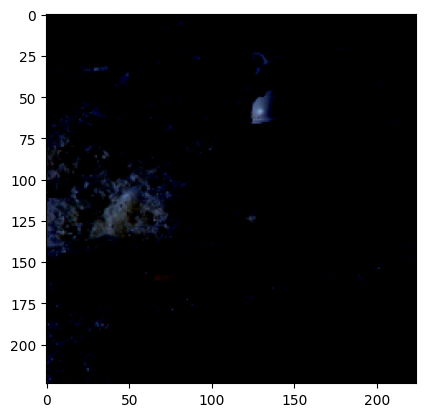

[['<start>', 'a', 'kayaker', 'wearing', 'yellow', 'fights', 'the', 'rapids', '.', '<end>']]
[['<start>', 'a', 'kayaker', 'wearing', 'yellow', 'fights', 'the', 'rapids', '.', '<end>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>']]


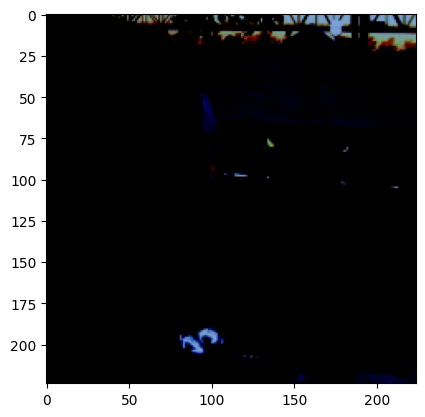

[['<start>', 'a', 'person', 'standing', 'on', 'the', 'sidewalk', 'near', 'a', 'large', 'gathering', 'of', 'people', 'at', 'a', 'tent', '.', '<end>']]
[['<start>', 'a', 'person', 'standing', 'on', 'the', 'sidewalk', 'near', 'a', 'large', 'gathering', 'of', 'people', 'at', 'a', 'tent', '.', '<end>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>']]


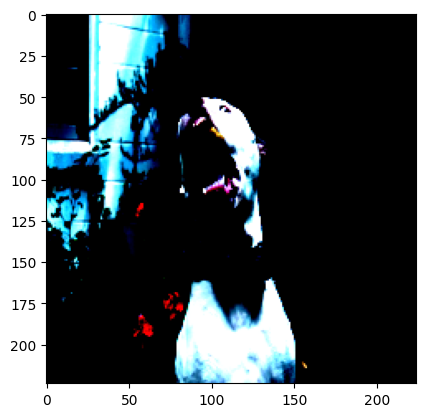

[['<start>', 'a', 'dog', 'catching', 'a', 'biscuit', 'in', 'its', 'mouth', '.', '<end>']]
[['<start>', 'a', 'dog', 'catching', 'a', 'biscuit', 'in', 'its', 'mouth', '.', '<end>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>']]


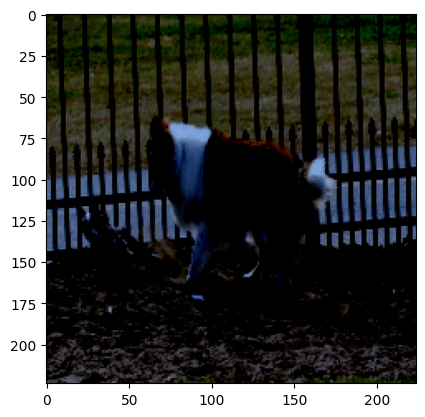

[['<start>', 'a', 'brown', 'and', 'white', 'dog', 'standing', 'next', 'to', 'a', 'smaller', 'brown', 'and', 'white', 'dog', 'in', 'front', 'of', 'a', 'fence', '.', '<end>']]
[['<start>', 'a', 'brown', 'and', 'white', 'dog', 'standing', 'next', 'to', 'a', 'smaller', 'brown', 'and', 'white', 'dog', 'in', 'front', 'of', 'a', 'fence', '.', '<end>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>']]


In [ ]:
embed_size = 300
hidden_size = 300
vocab_size = len(vocab_itos)
num_layers = 1

batch_size = 5
weight_decay = 0.001
learning_rate = 0.001
num_epochs = 200

model = EncoderToDecoder(embed_size, hidden_size, vocab_size, num_layers)

sample_size = 5

small_train = []
small_valid = []

train_indices = random.sample(range(len(train_data)), sample_size)
valid_indices = random.sample(range(len(valid_data)), sample_size)

for i in train_indices:
  small_train.append(train_data[i])
for i in valid_indices:
  small_valid.append(valid_data[i])

train(model, small_train, small_valid, batch_size=batch_size, weight_decay=weight_decay, learning_rate=learning_rate, num_epochs=num_epochs)

for x, y in small_train:
  plt.imshow(x.permute(1, 2, 0))
  plt.show()

  print(indices_to_words([make_prediction(model, x)]))
  print(indices_to_words([y.tolist()]))

# Tuning Hyperparameters and Testing the Model 

We use the following block of code to use the grid search algorithm to thoroughly test a large combination of hyperparameters. Please note that running the code is very computationally expensive.

In [ ]:
hyperparams = {
    'batch_size': [16, 32, 64, 128],
    'weight_decay': [0.0, 0.1, 0.01, 0.001, 0.0001],
    'learning_rate': [0.1, 0.01, 0.001, 0.0001, 0.00001],
    'num_epochs': [3, 5, 7, 9]
}


# create a list of all possible hyperparameter combinations

all_params = list(product(*hyperparams.values()))

# evaluate the model for each hyperparameter combination
best_val_acc = 0
best_params = None
for params in all_params:
    print("Training with params:", params)
    embed_size = 300
    hidden_size = 300
    vocab_size = len(vocab_itos)
    num_layers = 1

    model = EncoderToDecoder(embed_size, hidden_size, vocab_size, num_layers)
    val_accs, train_accs = train(model, train_data, valid_data, *params)
    curr_best_val_acc = max(val_accs)
    if curr_best_val_acc > best_val_acc:
        best_val_acc = curr_best_val_acc
        best_params = params

print("Best validation accuracy:", best_val_acc)
print("Best hyperparameters:", best_params)

Running the grid search revealed that the best hyperparameters are:

**Batch Size**: 64

**Weight Decay**: 0.001

**Learning Rate**: 0.001

**Epochs**: 5

The following code shows the accuracies for our most optimal model

In [ ]:
model_save_path = '/content/gdrive/My Drive/CSC413 final project/trained_model.pth'

Iter 188. [Val Acc 40%] [Val BLEU Score 18%] [Train Acc 42%, Train BLEU Score 19%,Loss 3.502142]
Iter 376. [Val Acc 41%] [Val BLEU Score 19%] [Train Acc 44%, Train BLEU Score 20%,Loss 3.208909]
Iter 564. [Val Acc 42%] [Val BLEU Score 20%] [Train Acc 44%, Train BLEU Score 21%,Loss 3.038848]
Iter 752. [Val Acc 42%] [Val BLEU Score 20%] [Train Acc 45%, Train BLEU Score 21%,Loss 3.129895]
Iter 940. [Val Acc 43%] [Val BLEU Score 20%] [Train Acc 45%, Train BLEU Score 22%,Loss 3.265603]
Iter 1128. [Val Acc 42%] [Val BLEU Score 20%] [Train Acc 45%, Train BLEU Score 22%,Loss 2.905853]
Iter 1316. [Val Acc 43%] [Val BLEU Score 21%] [Train Acc 46%, Train BLEU Score 23%,Loss 3.039563]


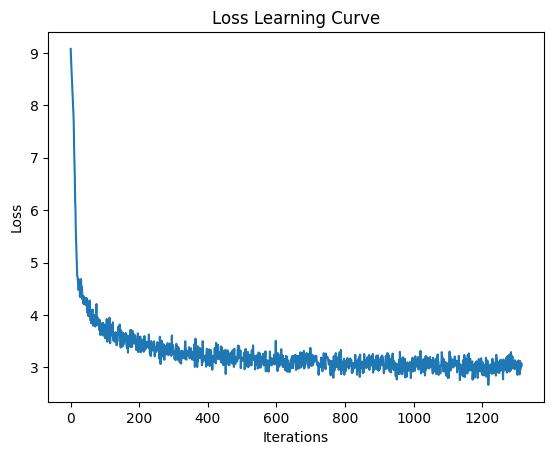

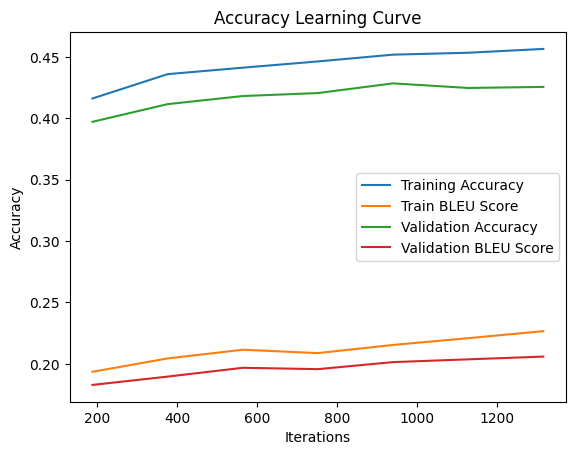

In [ ]:
embed_size = 300
hidden_size = 300
vocab_size = len(vocab_itos)
num_layers = 1

model = EncoderToDecoder(embed_size, hidden_size, vocab_size, num_layers)

train(model, train_data, valid_data, batch_size=64, weight_decay=0.001, learning_rate=0.001, num_epochs=7)

# Save trained model
torch.save(model.state_dict(), model_save_path)

In [ ]:
# Load trained model
embed_size = 300
hidden_size = 300
vocab_size = len(vocab_itos)
num_layers = 1

model = EncoderToDecoder(embed_size, hidden_size, vocab_size, num_layers)
model.load_state_dict(torch.load(model_save_path))

<All keys matched successfully>

In [ ]:
# Find test set accuracy
model.eval() # Set the model to evaluation mode

# test_acc, test_bleu = get_accuracy(model, test_data)
test_acc, test_bleu = get_accuracy_no_teacher_forcing(model, test_data)

print(f"Test accuracy: {test_acc * 100:.2f}%")
print(f"Test BLEU score: {test_bleu * 100:.2f}%")


Test accuracy: 33.01%
Test BLEU score: 7.89%


Unsuccessful example (BLEU score: 0.11):
True caption: <start> a black and white dog is running through a cow field . <end>
Generated caption: <start> a black dog is jumping over a pool . <end>


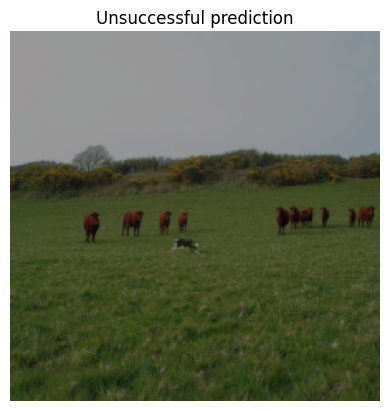

Successful example (BLEU score: 0.59):
True caption: <start> a black dog is running in snow . <end>
Generated caption: <start> a black dog is running through the snow . <end>


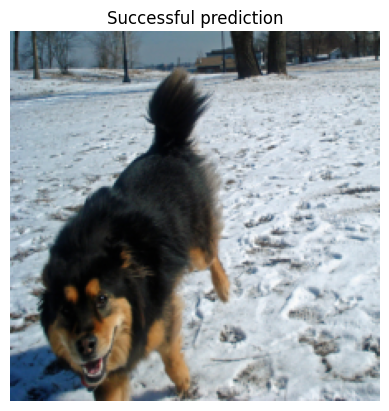

In [ ]:
# Display test examples, one successful and one unsuccessful

bleu_score_threshold = 0.5 # We will say that a BLEU score > threshold is successful
successful_example_found = False
unsuccessful_example_found = False
smoothie = SmoothingFunction().method1
model.eval() # Set to evaluation mode

def tensor_to_words(tensor):
    indices = tensor.tolist()
    return indices_to_words([indices])[0]

while not (successful_example_found and unsuccessful_example_found):
    # select a random sample from the test dataset
    random_index = random.randint(0, len(test_data) - 1)
    image_tensor, true_caption_indices = test_data[random_index]
    image_tensor = unnormalize(image_tensor)

    # make the prediction
    generated_caption_indices = make_prediction(model, image_tensor.unsqueeze(0))

    # Calculate the BLEU score
    true_caption_indices = true_caption_indices[true_caption_indices != pad_index]
    true_caption_indices = true_caption_indices.tolist()
    true_caption = indices_to_words([true_caption_indices])[0]
    generated_caption = indices_to_words([generated_caption_indices])[0]
    bleu_score = sentence_bleu([true_caption], generated_caption, smoothing_function=smoothie)

    if bleu_score >= bleu_score_threshold and not successful_example_found:
        print("Successful example (BLEU score: {:.2f}):".format(bleu_score))
        print("True caption:", " ".join(true_caption))
        print("Generated caption:", " ".join(generated_caption))
        plt.imshow(image_tensor.permute(1,2,0))
        plt.title("Successful prediction")
        plt.axis('off')
        plt.show()
        successful_example_found = True

    elif bleu_score < bleu_score_threshold and not unsuccessful_example_found:
        print("Unsuccessful example (BLEU score: {:.2f}):".format(bleu_score))
        print("True caption:", " ".join(true_caption))
        print("Generated caption:", " ".join(generated_caption))
        plt.imshow(image_tensor.permute(1,2,0))
        plt.title("Unsuccessful prediction")
        plt.axis('off')
        plt.show()
        unsuccessful_example_found = True



True caption: <start> four rugby players on the ground with two standing behind them . <end>
Generated caption: <start> a man in a red shirt is standing in the air . <end>


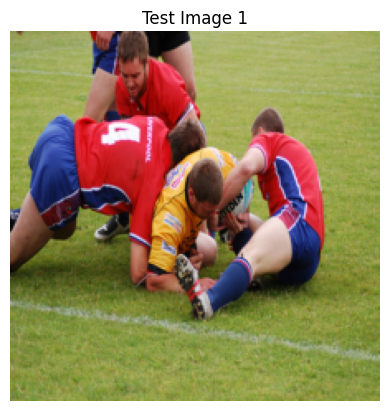



True caption: <start> a brown and white dog is playing with a toy in a field of green grass and clover . <end>
Generated caption: <start> a brown dog is running through the snow . <end>


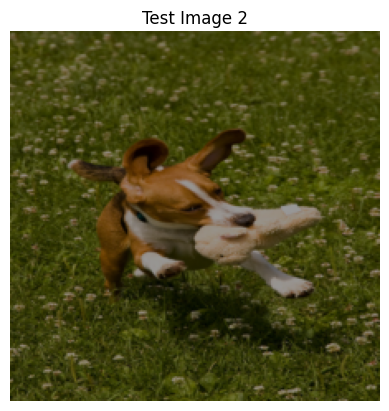



True caption: <start> a woman in a blue sweater with a blue scarf around her head . <end>
Generated caption: <start> a man in a red shirt and a black shirt is standing in front of a building . <end>


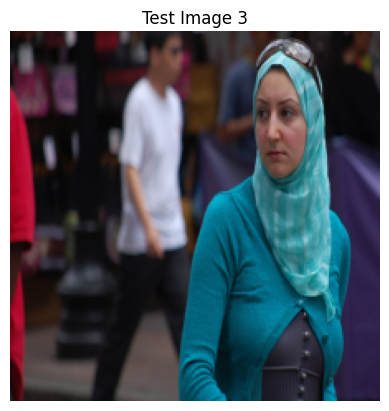



True caption: <start> a person in a red hat and shoes doing stunts on a red bike while a person in yellow watches . <end>
Generated caption: <start> a man in a red shirt is jumping over a tree . <end>


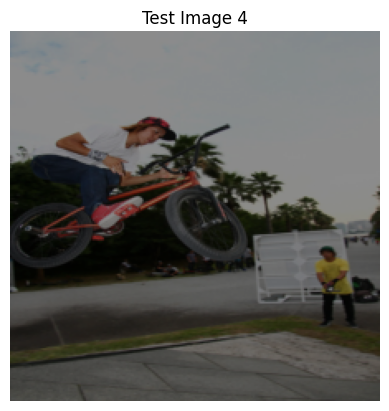



True caption: <start> there are two ladies embracing and posing shown here . <end>
Generated caption: <start> a man in a black shirt and a black shirt is standing in front of a building . <end>


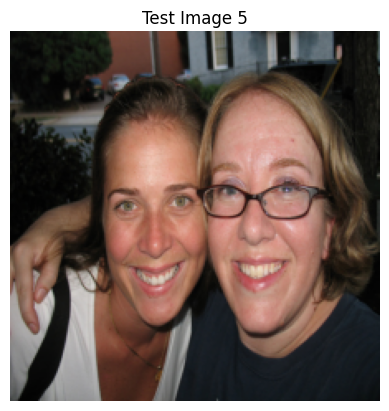



True caption: <start> a woman and a girl sitting on a front lawn <end>
Generated caption: <start> a boy in a red shirt is standing in front of a building . <end>


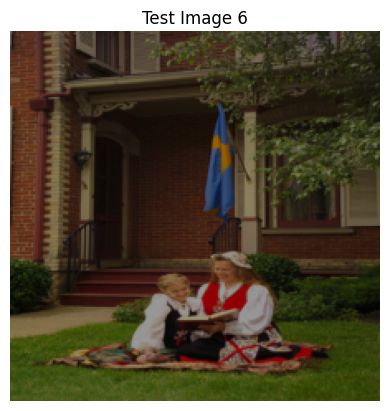



True caption: <start> a man in a pink shirt and white vest plays a guitar . <end>
Generated caption: <start> a man in a red shirt is standing in front of a building . <end>


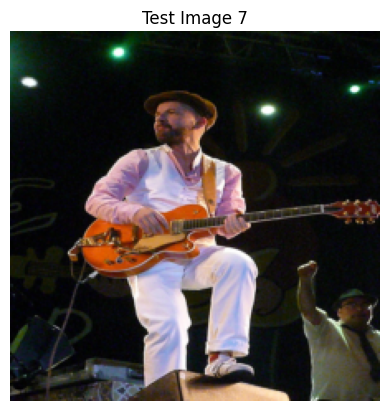



True caption: <start> a bmx rider , wall rides . <end>
Generated caption: <start> a black dog is jumping in the air . <end>


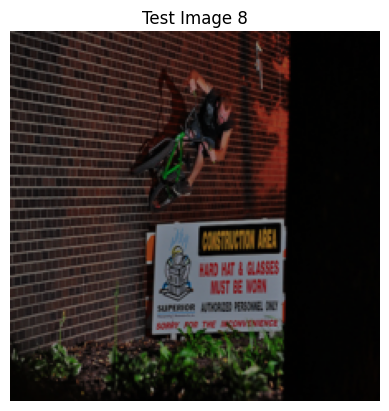



True caption: <start> a man surfing . <end>
Generated caption: <start> a man in a red shirt is jumping on a rock . <end>


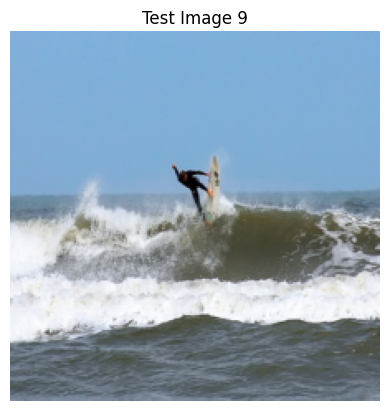



True caption: <start> a dog drinks the sprinkler water . <end>
Generated caption: <start> a black dog is running through the snow . <end>


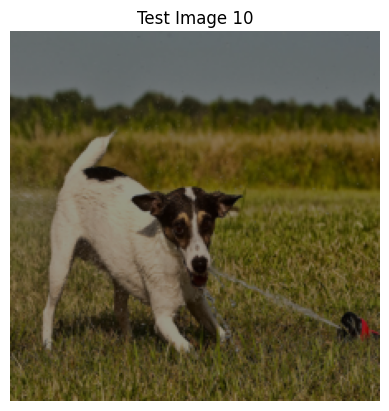



True caption: <start> a bunch of vintage cars are parked in a lot . <end>
Generated caption: <start> a man in a black shirt is standing on a rock . <end>


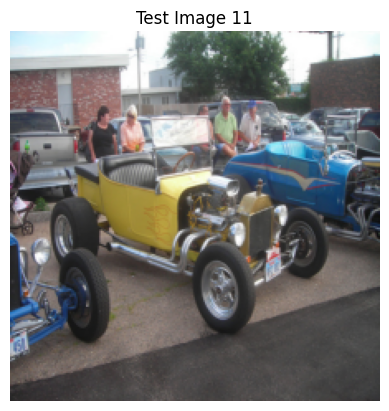



True caption: <start> a brown and black dog is jumping through a sprinkler . <end>
Generated caption: <start> a black dog is jumping in the air . <end>


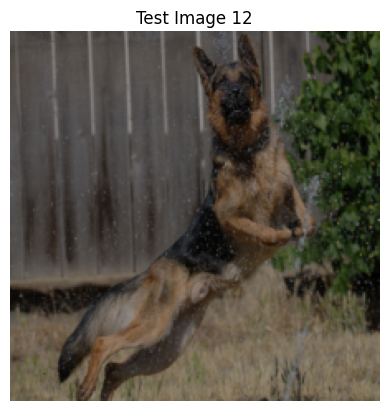



True caption: <start> a group of people ride in a race <end>
Generated caption: <start> a man in a red shirt is standing in front of a building . <end>


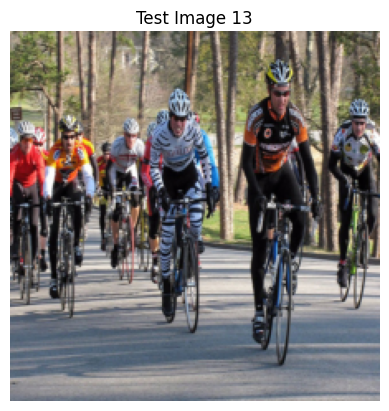



True caption: <start> a man and woman sitting in chairs next to a turquoise truck . <end>
Generated caption: <start> a black dog is jumping in the air . <end>


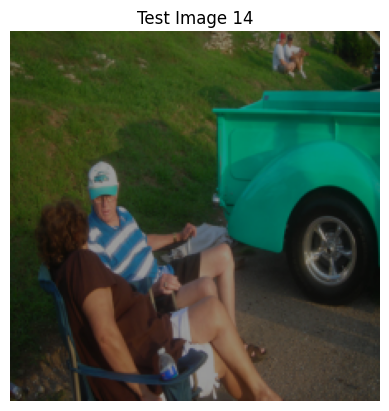



True caption: <start> a balding man with glasses stands in front of a colorful display . <end>
Generated caption: <start> a man in a red shirt and a black shirt is standing in front of a building . <end>


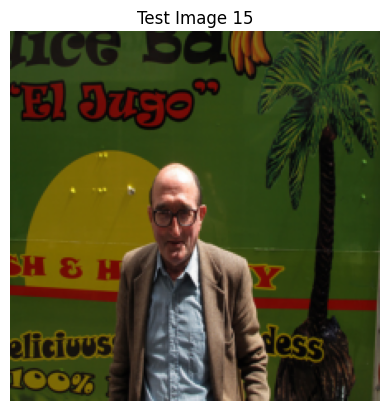



True caption: <start> four dogs are playing and jumping in the air outside . <end>
Generated caption: <start> a brown dog is running through the water . <end>


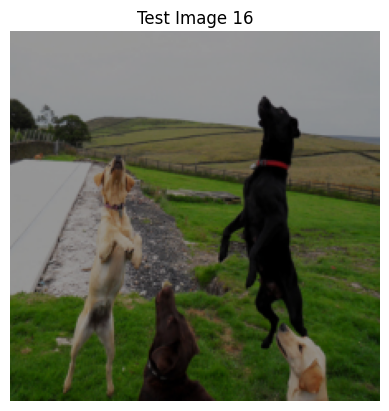



True caption: <start> one man kicks another in the shoulder at a martial arts event . <end>
Generated caption: <start> a black dog is running through the water . <end>


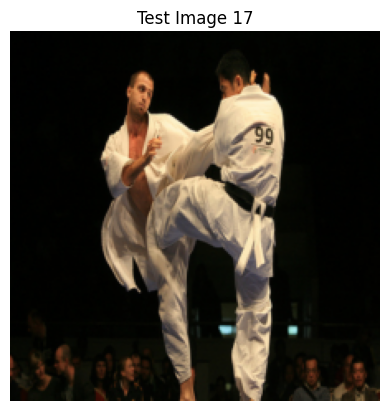



True caption: <start> a man is posed standing on one hand on a skateboard ramp . <end>
Generated caption: <start> a man in a red shirt is jumping over a tree . <end>


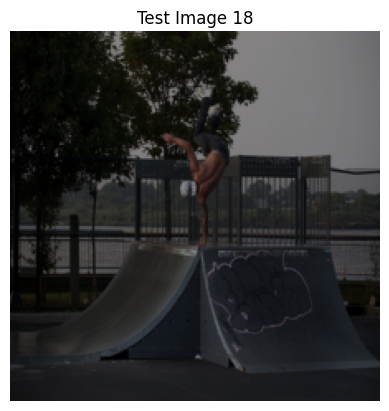



True caption: <start> a little girl looks at a birthday cake while a man holds a baby . <end>
Generated caption: <start> a boy in a red shirt is standing in front of a building . <end>


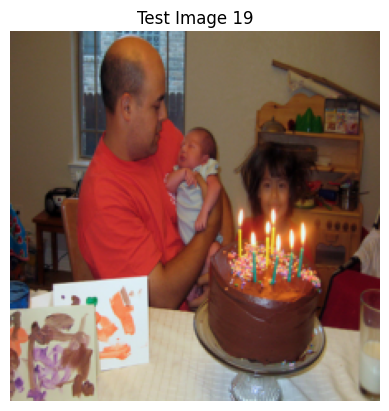



True caption: <start> a lady sitting on a front porch reading a book . <end>
Generated caption: <start> a man in a red shirt and a black shirt is standing in front of a building . <end>


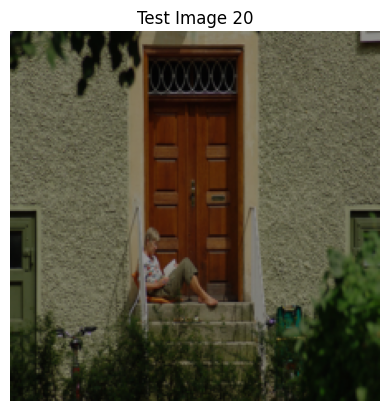



True caption: <start> a little girl rides a toy bike and laughs . <end>
Generated caption: <start> a boy in a red shirt and a black shirt is standing in the air . <end>


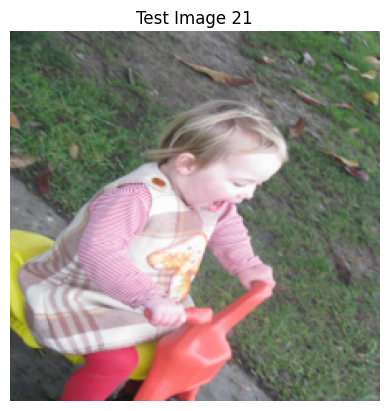



True caption: <start> a baby in a baby seat wearing a red beanie that says " love " . <end>
Generated caption: <start> a man in a red shirt is standing on a bench . <end>


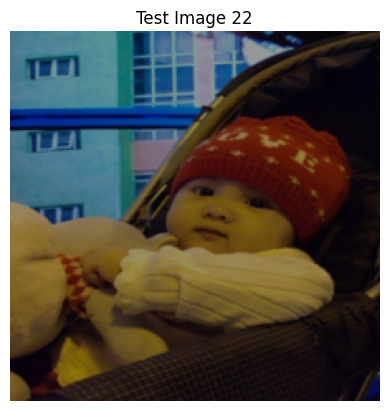



True caption: <start> two boys are playing on a trampoline . <end>
Generated caption: <start> a man in a red shirt and a black shirt is standing in front of a building . <end>


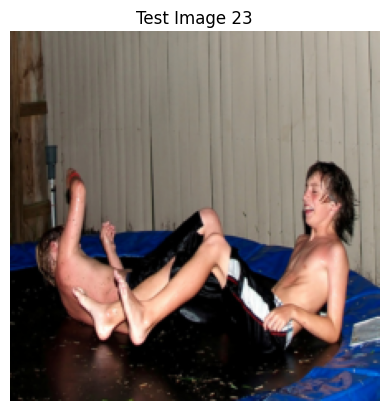



True caption: <start> there are two kids in swimmies playing outside next to some trees . <end>
Generated caption: <start> a black dog is jumping over a pool . <end>


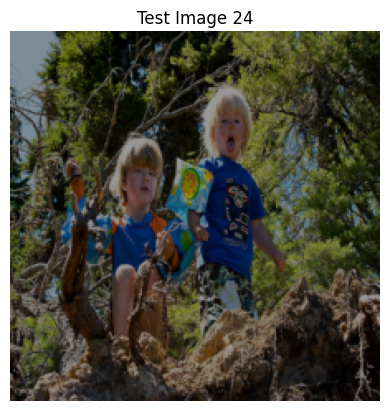



True caption: <start> a boy with blue eyes hanging off a play set . <end>
Generated caption: <start> a man in a red shirt and a black shirt is standing in front of a building . <end>


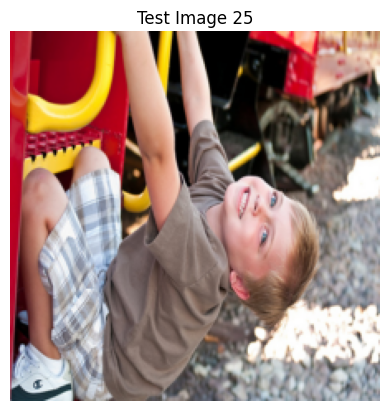



True caption: <start> a woman points at somthing while antoher woman touches her hand at a bar . <end>
Generated caption: <start> a man in a red shirt and a black shirt is standing in front of a building . <end>


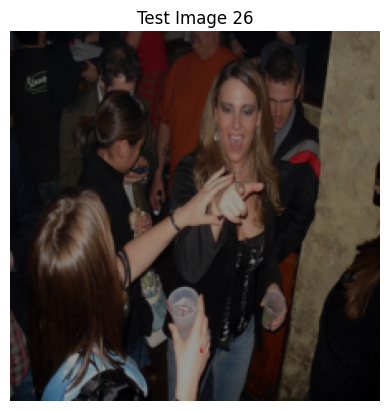



True caption: <start> a man in a patterned shirt holds a beer bottle . <end>
Generated caption: <start> a boy in a red shirt and a black shirt is standing in front of a building . <end>


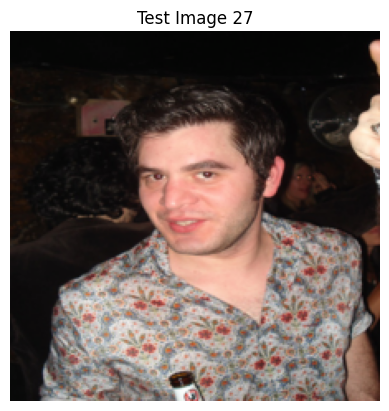



True caption: <start> a little girl wearing a pink shirt is sitting at the table and drinking a milkshake <end>
Generated caption: <start> a boy in a red shirt and a black shirt is standing in front of a building . <end>


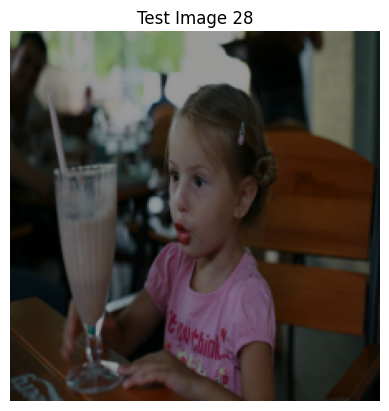



True caption: <start> a boy pitches in a baseball game . <end>
Generated caption: <start> a boy in a red shirt is standing in the air . <end>


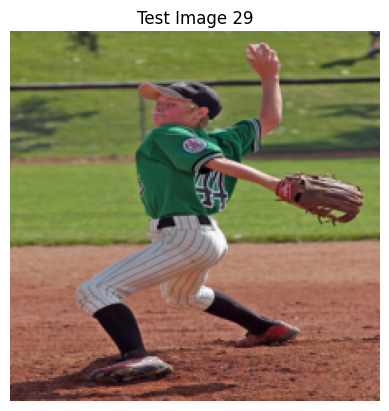



True caption: <start> a brown dog with a green ball sit in the snow . <end>
Generated caption: <start> a black dog is jumping in the snow . <end>


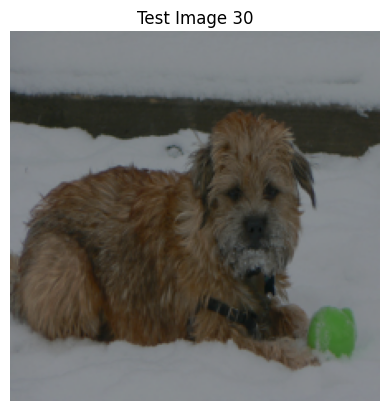



True caption: <start> a blond toddler wearing a blue sweater , riding on a wooden toy . <end>
Generated caption: <start> a boy in a red shirt and a black shirt is standing in front of a building . <end>


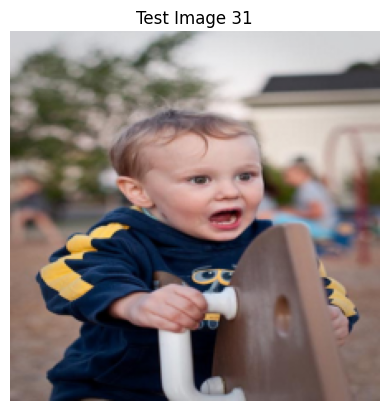



True caption: <start> a couple shops at an antique store . <end>
Generated caption: <start> a man in a red shirt and a black shirt is standing in front of a building . <end>


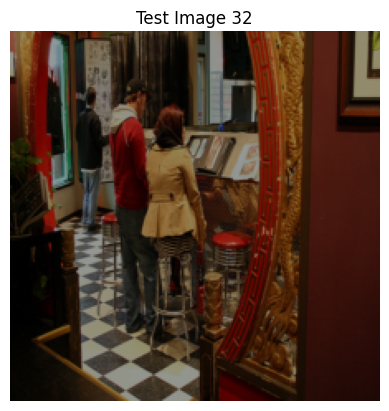



True caption: <start> a little boy with a bib on is watching the camera . <end>
Generated caption: <start> a man in a red shirt and a black shirt is standing in front of a building . <end>


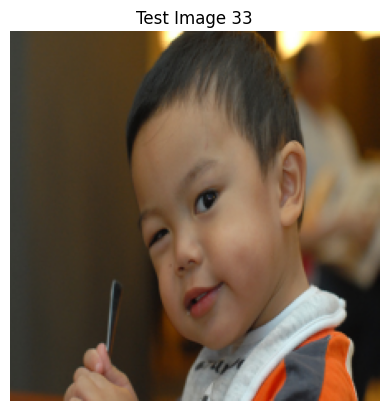



True caption: <start> a girl dives into the water while another girl watches her . <end>
Generated caption: <start> a black dog is running through the snow . <end>


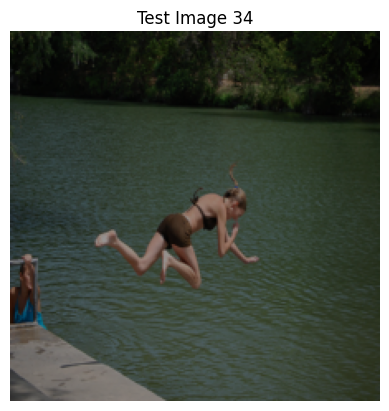



True caption: <start> a girl at a wedding holding some orange flowers <end>
Generated caption: <start> a man in a red shirt is standing in front of a building . <end>


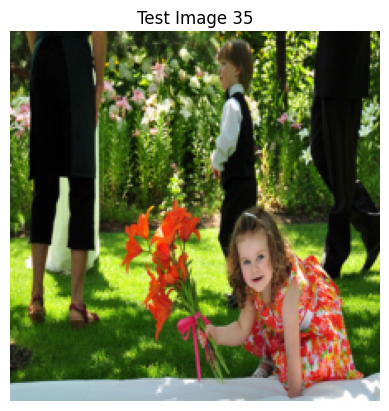



True caption: <start> a baby girl in an orange dress gets wet as she stands next to a water sprinkler . <end>
Generated caption: <start> a boy in a red shirt is standing in the air . <end>


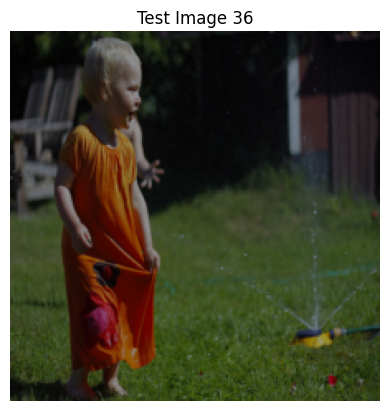



True caption: <start> a white dog is running along a path outside . <end>
Generated caption: <start> a black dog is jumping in the snow . <end>


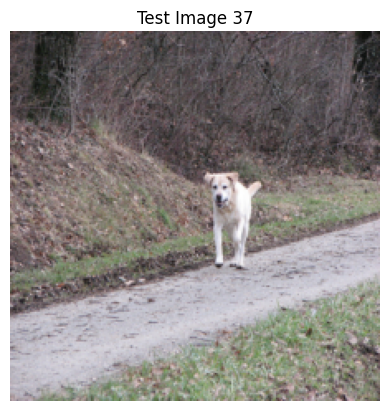



True caption: <start> a black and brown dog is running between two cement barriers with snow . <end>
Generated caption: <start> a man in a red shirt is standing in front of a building . <end>


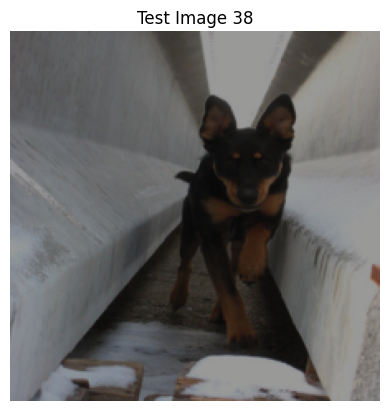



True caption: <start> a crowd walks along a sidewalk of a farmers market . <end>
Generated caption: <start> a man in a red shirt is standing in front of a crowd of people . <end>


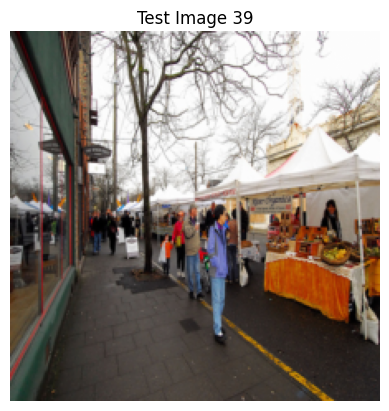



True caption: <start> a group of people stand at a farmers market on a dreary day . <end>
Generated caption: <start> a man in a red shirt is standing on a skateboard . <end>


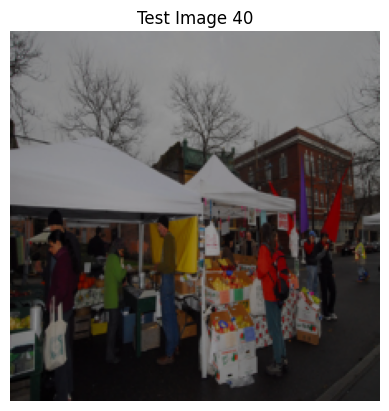



True caption: <start> a black dog is swimming while carrying a tennis <end>
Generated caption: <start> a black dog is jumping in the snow . <end>


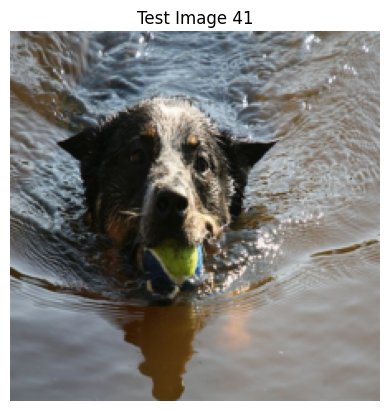



True caption: <start> two small white dogs are in a yard chasing a red ball . <end>
Generated caption: <start> a black dog is running through the water . <end>


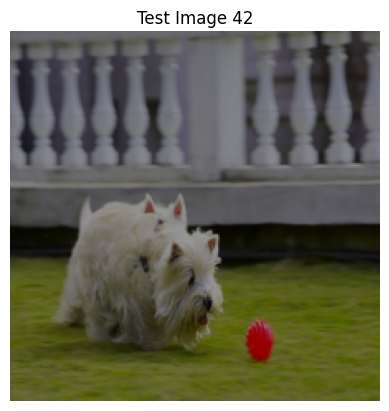



True caption: <start> a boy is putting the cone end of a melting ice cream cone in his mouth . <end>
Generated caption: <start> a man in a red shirt and a black shirt is standing in front of a building . <end>


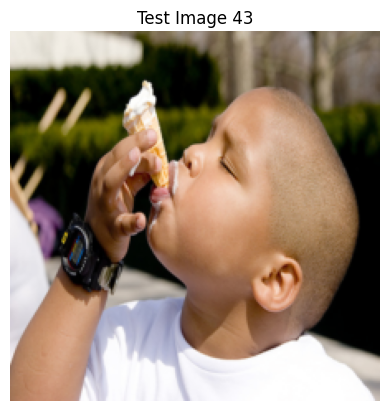



True caption: <start> a brown dog plays with a stick . <end>
Generated caption: <start> a brown dog is running through the snow . <end>


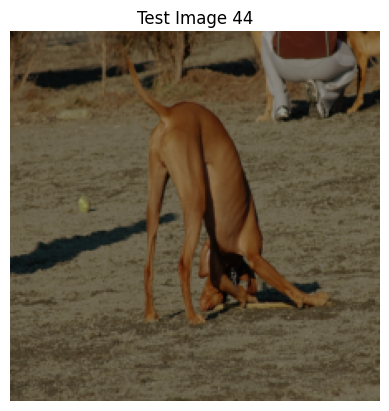



True caption: <start> a brown dog carries an object in its mouth on a snowy hillside . <end>
Generated caption: <start> a black dog is jumping in the snow . <end>


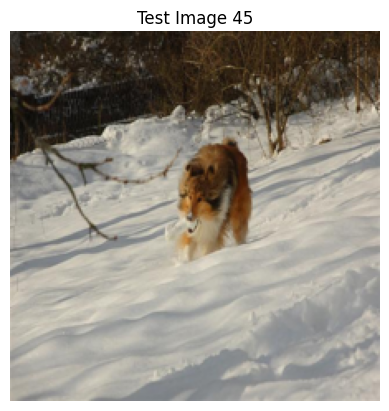



True caption: <start> a girl wearing a brown jacket and blue jeans has on some white headphones and is walking . <end>
Generated caption: <start> a boy in a red shirt is standing in a pool . <end>


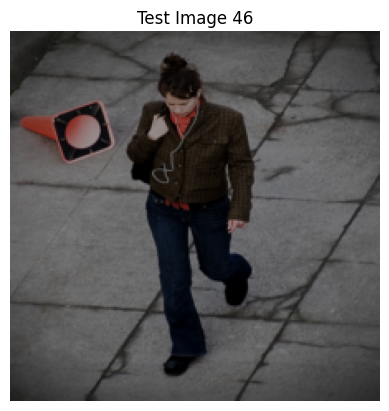



True caption: <start> a black dog carries a huge stick in its mouth . <end>
Generated caption: <start> a brown dog is running through the snow . <end>


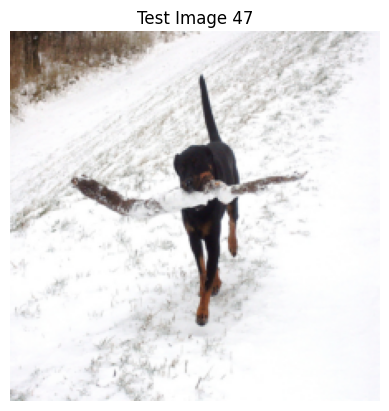



True caption: <start> a dog walking along the side of a house in the snow . <end>
Generated caption: <start> a black dog is jumping in the snow . <end>


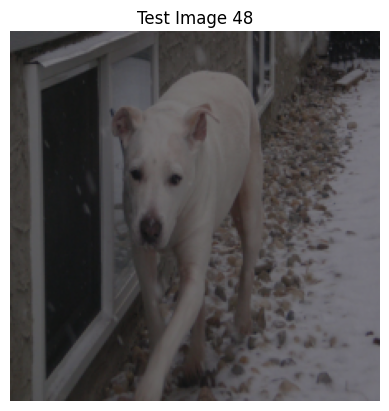



True caption: <start> a boy plays with a train set . <end>
Generated caption: <start> a boy in a red shirt and a black shirt is standing in front of a building . <end>


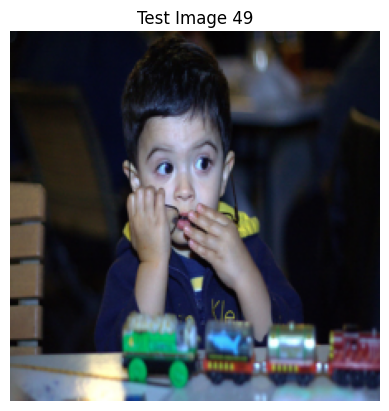



True caption: <start> a brown dog is carrying a toy in the snow . <end>
Generated caption: <start> a black dog is running through the snow . <end>


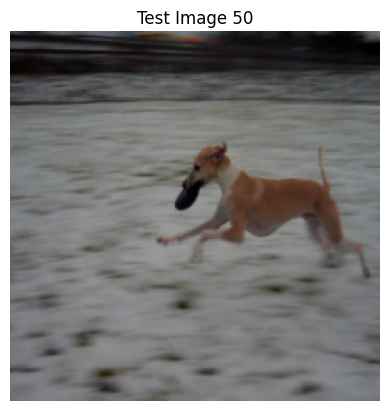

In [ ]:
# Descriptions for 50 test images

num_examples_to_display = 50*5
to_pil_image = ToPILImage()

for i in range(0, num_examples_to_display, 5): # Every 5th image
    image_tensor, true_caption_indices = test_data[i]
    image_tensor = unnormalize(image_tensor)

    # make the prediction
    generated_caption_indices = make_prediction(model, image_tensor.unsqueeze(0))

    # Get the true and generated captions
    true_caption_indices = true_caption_indices[true_caption_indices != pad_index]
    true_caption_indices = true_caption_indices.tolist()
    true_caption = indices_to_words([true_caption_indices])[0]
    generated_caption = indices_to_words([generated_caption_indices])[0]

    # Display the image, true caption, and generated caption
    print("\n\nTrue caption:", " ".join(true_caption))
    print("Generated caption:", " ".join(generated_caption))
    
    
    plt.imshow(image_tensor.permute(1,2,0))
    iteration = i//5 + 1
    plt.title("Test Image " + str(iteration))
    plt.axis('off')
    plt.show()